<a href="https://colab.research.google.com/github/Auvarmf/PKCV/blob/main/Model3CV2_Test2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [47]:
!pip install visualkeras

In [48]:
import numpy as np
import os
import cv2
import tensorflow as tf
from tqdm import tqdm
import shutil
from sklearn.utils import shuffle
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input as inception_preprocess_input
from tensorflow.keras.applications.xception import Xception, preprocess_input as xception_preprocess_input
from tensorflow.keras.applications.densenet import DenseNet121, preprocess_input as densenet_preprocess_input
from tensorflow.keras.layers import Dropout
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import visualkeras
from google.colab import drive
from PIL import Image

In [49]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)

# Check if GPU is available
if tf.test.gpu_device_name():
    print('GPU device found:', tf.test.gpu_device_name())
else:
    print("No GPU found. Please ensure you've enabled GPU acceleration in Colab (Runtime > Change runtime type > Hardware accelerator > GPU).")

TensorFlow version: 2.15.0
GPU device found: /device:GPU:0


In [50]:
# Mount Google Drive to access files and folders
drive.mount('/content/PKCV')

Drive already mounted at /content/PKCV; to attempt to forcibly remount, call drive.mount("/content/PKCV", force_remount=True).


In [51]:
# Define the base directory where all images are stored
BASE_DIR = '/content/PKCV/MyDrive/PROSUSCV/dataset_butterfly'
train_dir = os.path.join(BASE_DIR, 'train')
val_dir = os.path.join(BASE_DIR, 'validation')
test_dir = os.path.join(BASE_DIR, 'test')

class_names = os.listdir(train_dir)

class_names_label = {class_name: i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)

IMG_SIZE = (299, 299)

In [52]:
def load_data(directory):
    images = []
    labels = []

    for folder in os.listdir(directory):
        if folder in class_names:
            label = class_names.index(folder)

            for file in os.listdir(os.path.join(directory, folder)):
                img_path = os.path.join(os.path.join(directory, folder), file)

                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.webp')):
                    image = cv2.imread(img_path)

                    if image is not None:
                        image = cv2.resize(image, IMG_SIZE)
                        images.append(image)
                        labels.append(label)

    images = np.array(images, dtype="float32")
    labels = np.array(labels, dtype="int32")

    # Shuffle the data using sklearn.utils.shuffle
    images, labels = shuffle(images, labels, random_state=25)

    return images, labels

In [53]:
train_images, train_labels = load_data(train_dir)
test_images, test_labels = load_data(test_dir)

In [54]:
train_images, train_labels = shuffle(train_images, train_labels, random_state=25)

In [55]:
def display_examples(class_names, images, labels):
    figsize = (20, 20)
    fig = plt.figure(figsize=figsize)
    fig.suptitle("Contoh Sampel Dataset", fontsize=16)
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i].astype(np.uint8))
        plt.xlabel(class_names[labels[i]])
    plt.show()

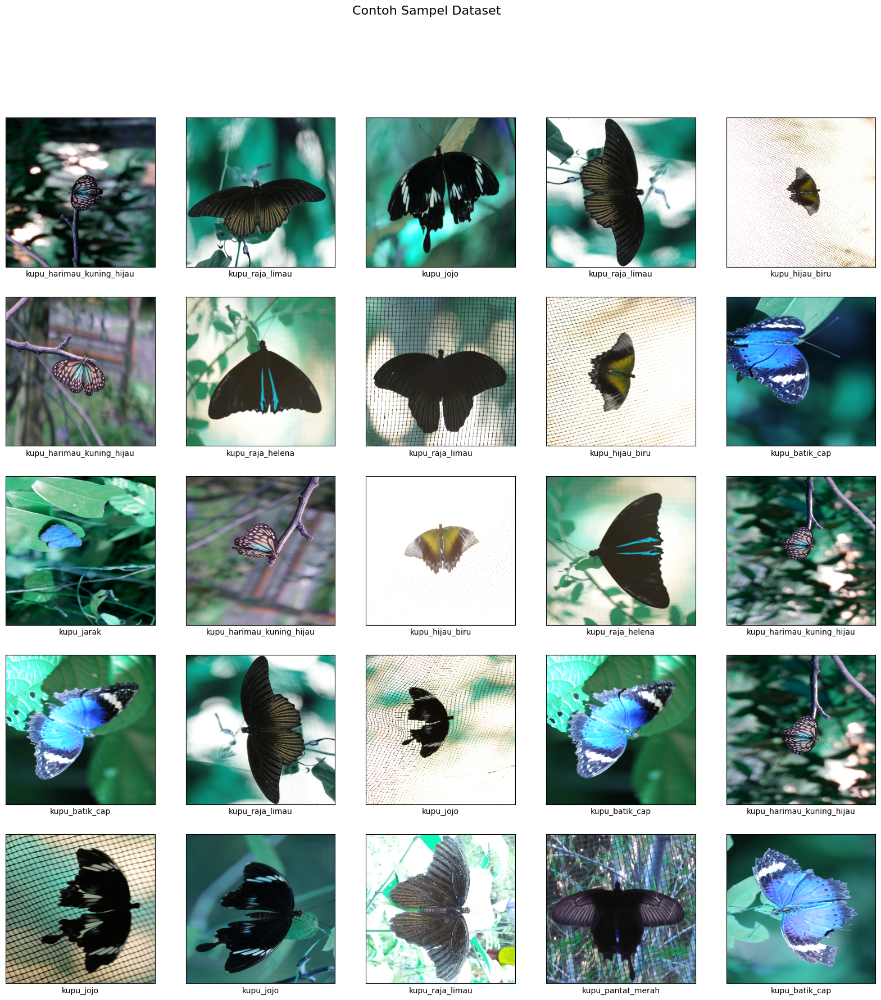

In [56]:
display_examples(class_names, train_images, train_labels)

In [57]:
train_data = ImageDataGenerator(rescale=1/255)
validation_data = ImageDataGenerator(rescale=1/255)

In [58]:
train_dataset = train_data.flow_from_directory(train_dir,
                                               target_size=IMG_SIZE,
                                               batch_size=32,
                                               class_mode='sparse')

validation_dataset = validation_data.flow_from_directory(val_dir,
                                                         target_size=IMG_SIZE,
                                                         batch_size=32,
                                                         class_mode='sparse')

test_dataset = validation_data.flow_from_directory(test_dir,
                                                   target_size=IMG_SIZE,
                                                   batch_size=32,
                                                   class_mode='sparse')

Found 560 images belonging to 8 classes.
Found 80 images belonging to 8 classes.
Found 160 images belonging to 8 classes.


In [59]:
# Preprocess the images for InceptionV3 and Xception
train_images = tf.keras.applications.inception_v3.preprocess_input(train_images)
test_images = tf.keras.applications.inception_v3.preprocess_input(test_images)

In [60]:
# Define the input shape according to the model
input_shape = IMG_SIZE + (3,)  # For InceptionV3 and Xception

In [61]:
# Membangun model dengan InceptionV3 base
def build_model_inceptionv3(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    predictions = Dense(nb_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Membangun model dengan Xception base
def build_model_xception(base_model):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(nb_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

# Membangun model dengan GoogLeNet base
def build_model_googlenet(base_model):
    x = base_model.output
    x = Flatten()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(nb_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

In [62]:
# Membuat model InceptionV3
inception_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
# Membuat model kustom di atas InceptionV3
inception_custom_model = build_model_inceptionv3(inception_model)

# Membuat model Xception
xception_model = Xception(weights='imagenet', include_top=False, input_shape=input_shape)
# Membuat model kustom di atas Xception
xception_custom_model = build_model_xception(xception_model)

# Membuat model GoogLeNet
googlenet_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
# Membuat model kustom di atas GoogLeNet
googlenet_custom_model = build_model_googlenet(googlenet_model)

In [63]:
# Penyesuaian Learning Rate
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.0001)

In [64]:
# Augmentasi Data
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [65]:
# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [66]:
# Compile the models with adjusted learning rate
inception_custom_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
googlenet_custom_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
xception_custom_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [67]:
# Train the models
inception_history = inception_custom_model.fit(
    train_datagen.flow(train_images, train_labels, batch_size=32),
    epochs=30,
    validation_data=(test_images, test_labels),
    callbacks=[reduce_lr])

Epoch 1/30
18/18 [==============================] - 54s 1s/step - loss: 1.0812 - accuracy: 0.6429 - val_loss: 12.2955 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 2/30
18/18 [==============================] - 16s 876ms/step - loss: 0.3561 - accuracy: 0.9161 - val_loss: 3715.6472 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 3/30
18/18 [==============================] - 16s 895ms/step - loss: 0.3156 - accuracy: 0.9339 - val_loss: 583.5087 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 4/30
18/18 [==============================] - 16s 877ms/step - loss: 0.3671 - accuracy: 0.9214 - val_loss: 354.0677 - val_accuracy: 0.1625 - lr: 0.0010
Epoch 5/30
18/18 [==============================] - 17s 926ms/step - loss: 0.1624 - accuracy: 0.9661 - val_loss: 85.4883 - val_accuracy: 0.1875 - lr: 2.0000e-04
Epoch 6/30
18/18 [==============================] - 16s 861ms/step - loss: 0.1445 - accuracy: 0.9714 - val_loss: 12.5308 - val_accuracy: 0.2250 - lr: 2.0000e-04
Epoch 7/30
18/18 [==============================]

In [68]:
googlenet_history = googlenet_custom_model.fit(
    train_datagen.flow(train_images, train_labels, batch_size=32),
    epochs=30,
    validation_data=(test_images, test_labels),
    callbacks=[reduce_lr, early_stopping])

Epoch 1/30
18/18 [==============================] - 76s 1s/step - loss: 32.3976 - accuracy: 0.4661 - val_loss: 3314.6211 - val_accuracy: 0.1125 - lr: 0.0010
Epoch 2/30
18/18 [==============================] - 18s 997ms/step - loss: 3.8764 - accuracy: 0.8107 - val_loss: 7682.5547 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 3/30
18/18 [==============================] - 17s 929ms/step - loss: 10.2297 - accuracy: 0.7786 - val_loss: 2126156.7500 - val_accuracy: 0.1437 - lr: 0.0010
Epoch 4/30
18/18 [==============================] - 18s 977ms/step - loss: 7.2280 - accuracy: 0.8089 - val_loss: 154581.5469 - val_accuracy: 0.1250 - lr: 0.0010
Epoch 5/30
18/18 [==============================] - 18s 978ms/step - loss: 4.1975 - accuracy: 0.8411 - val_loss: 157057.4531 - val_accuracy: 0.1500 - lr: 2.0000e-04
Epoch 6/30
18/18 [==============================] - 18s 974ms/step - loss: 0.3571 - accuracy: 0.9232 - val_loss: 33119.9766 - val_accuracy: 0.2438 - lr: 2.0000e-04


In [69]:
xception_history = xception_custom_model.fit(
    train_datagen.flow(train_images, train_labels, batch_size=32),
    epochs=30,
    validation_data=(test_images, test_labels),
    callbacks=[reduce_lr, early_stopping])

Epoch 1/30
18/18 [==============================] - 45s 1s/step - loss: 0.3637 - accuracy: 0.8821 - val_loss: 0.8815 - val_accuracy: 0.9250 - lr: 0.0010
Epoch 2/30
18/18 [==============================] - 19s 1s/step - loss: 0.0545 - accuracy: 0.9893 - val_loss: 2.2118 - val_accuracy: 0.8625 - lr: 0.0010
Epoch 3/30
18/18 [==============================] - 19s 1s/step - loss: 0.1348 - accuracy: 0.9786 - val_loss: 2.5794 - val_accuracy: 0.9250 - lr: 0.0010
Epoch 4/30
18/18 [==============================] - 20s 1s/step - loss: 0.0863 - accuracy: 0.9857 - val_loss: 5.7818 - val_accuracy: 0.7625 - lr: 0.0010
Epoch 5/30
18/18 [==============================] - 19s 1s/step - loss: 0.0289 - accuracy: 0.9893 - val_loss: 0.4320 - val_accuracy: 0.9250 - lr: 2.0000e-04
Epoch 6/30
18/18 [==============================] - 20s 1s/step - loss: 0.0254 - accuracy: 0.9964 - val_loss: 0.5712 - val_accuracy: 0.9375 - lr: 2.0000e-04
Epoch 7/30
18/18 [==============================] - 19s 1s/step - loss: 0.

In [70]:
def plot_accuracy_loss(history, model_name):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(history.history['accuracy'], label='Train Accuracy')
    axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
    axes[0].set_title(f'{model_name} Training & Validation Accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()

    axes[1].plot(history.history['loss'], label='Train Loss')
    axes[1].plot(history.history['val_loss'], label='Validation Loss')
    axes[1].set_title(f'{model_name} Training & Validation Loss')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Loss')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

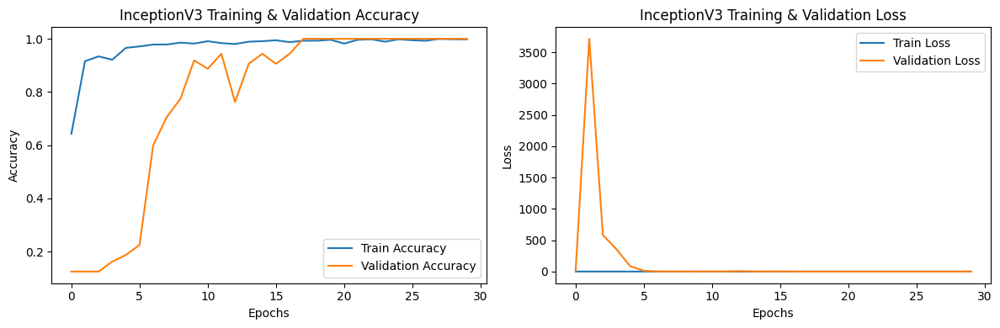

In [71]:
plot_accuracy_loss(inception_history, 'InceptionV3')

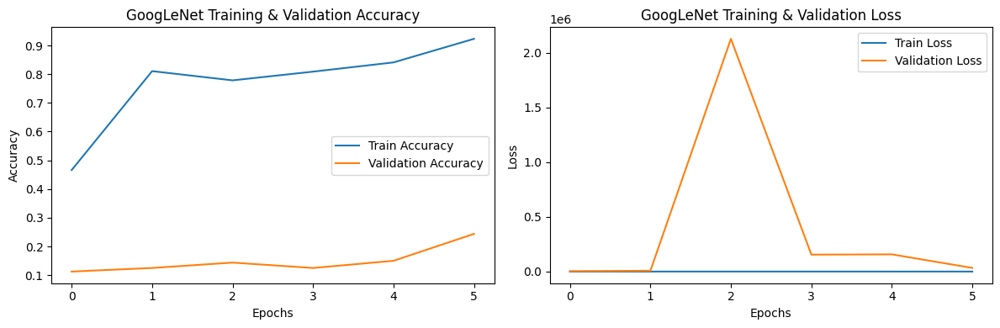

In [72]:
plot_accuracy_loss(googlenet_history, 'GoogLeNet')

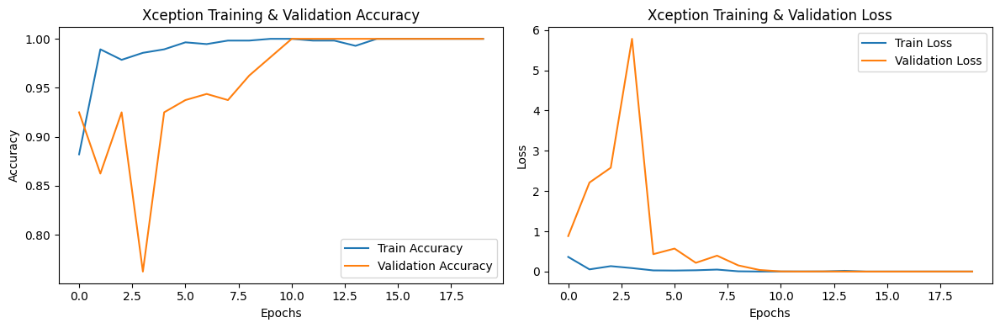

In [73]:
plot_accuracy_loss(xception_history, 'Xception')

In [74]:
# # Save the models
# inception_custom_model.save('/content/PKCV/MyDrive/PROSUSCV/H5_Model/inception_custom_model.h5')
# googlenet_custom_model.save('/content/PKCV/MyDrive/PROSUSCV/H5_Model/googlenet_custom_model.h5')
# xception_custom_model.save('/content/PKCV/MyDrive/PROSUSCV/H5_Model/xception_custom_model.h5')

In [75]:
# Summarize models
print("InceptionV3 Model Summary:")
inception_custom_model.summary()
plot_model(inception_custom_model, show_shapes=True, to_file='inception_module.png')

InceptionV3 Model Summary:
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_98 (Conv2D)          (None, 149, 149, 32)         864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_98 (Ba  (None, 149, 149, 32)         96        ['conv2d_98[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 149, 149, 32)         0      

GoogLeNet Model Summary:
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 305, 305, 3)          0         ['input_6[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 150, 150, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 150, 150, 64)         256      

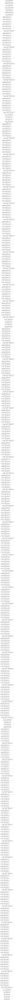

In [76]:
print("GoogLeNet Model Summary:")
googlenet_custom_model.summary()
plot_model(googlenet_custom_model, show_shapes=True, to_file='googlenet_module.png')

Xception Model Summary:
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 149, 149, 32)         864       ['input_5[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 149, 149, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 149, 149, 32)         0         

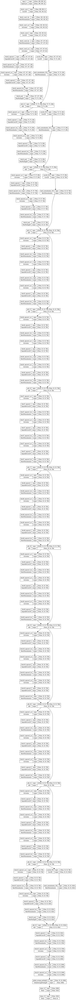

In [77]:
print("Xception Model Summary:")
xception_custom_model.summary()
plot_model(xception_custom_model, show_shapes=True, to_file='xception_module.png')

5/5 [==============================] - 2s 136ms/step


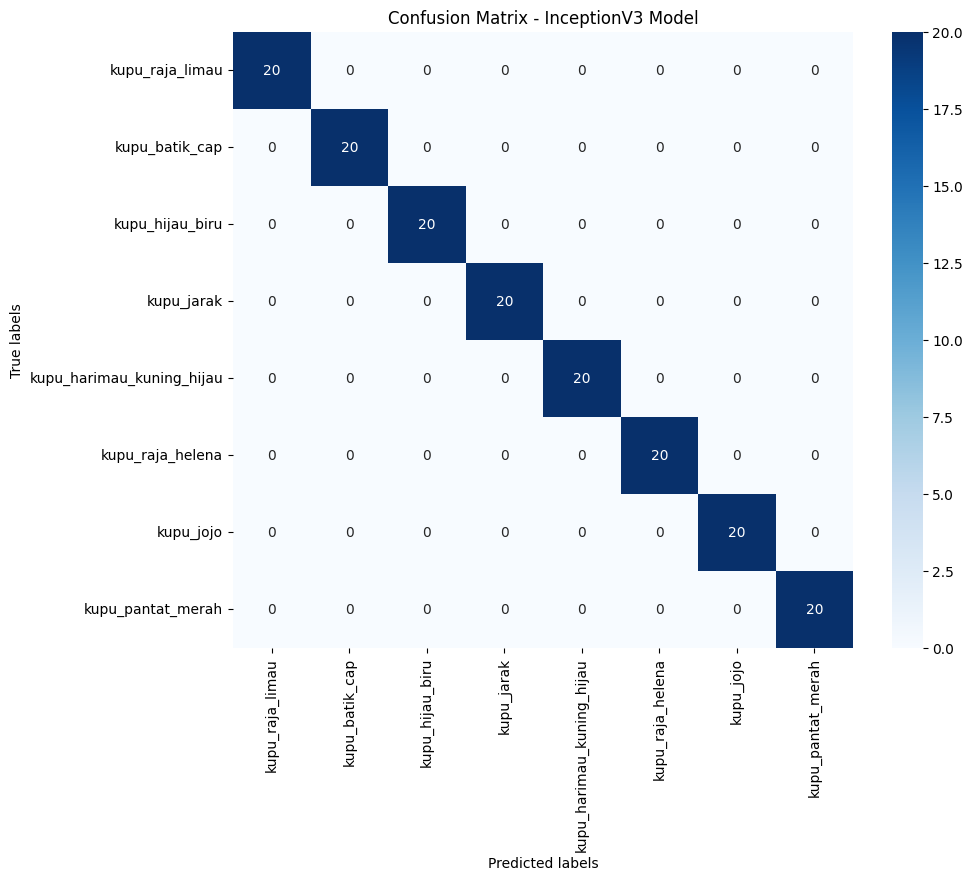

In [78]:
# Plot confusion matrix for InceptionV3 model
inception_predictions = inception_custom_model.predict(test_images)
inception_predictions_labels = np.argmax(inception_predictions, axis=1)
inception_conf_matrix = confusion_matrix(test_labels, inception_predictions_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(inception_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - InceptionV3 Model')
plt.show()

5/5 [==============================] - 3s 167ms/step


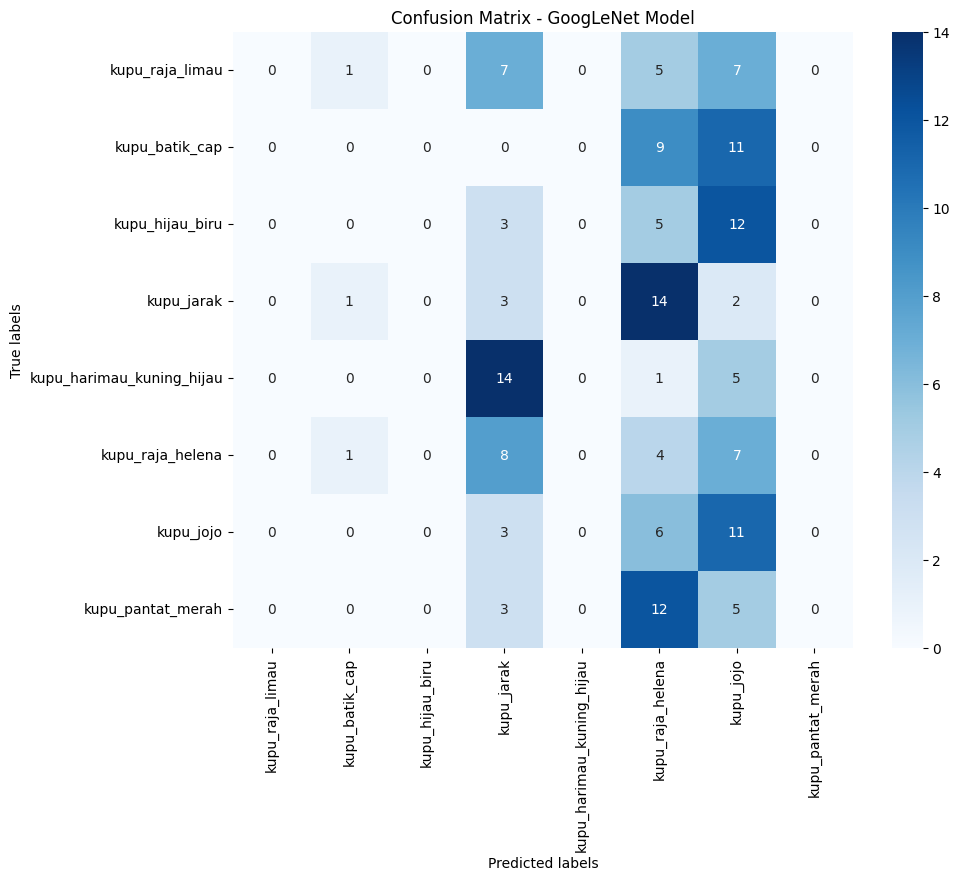

In [79]:
# Plot confusion matrix for GoogLeNet model
googlenet_predictions = googlenet_custom_model.predict(test_images)
googlenet_predictions_labels = np.argmax(googlenet_predictions, axis=1)
googlenet_conf_matrix = confusion_matrix(test_labels, googlenet_predictions_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(googlenet_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - GoogLeNet Model')
plt.show()

5/5 [==============================] - 2s 219ms/step


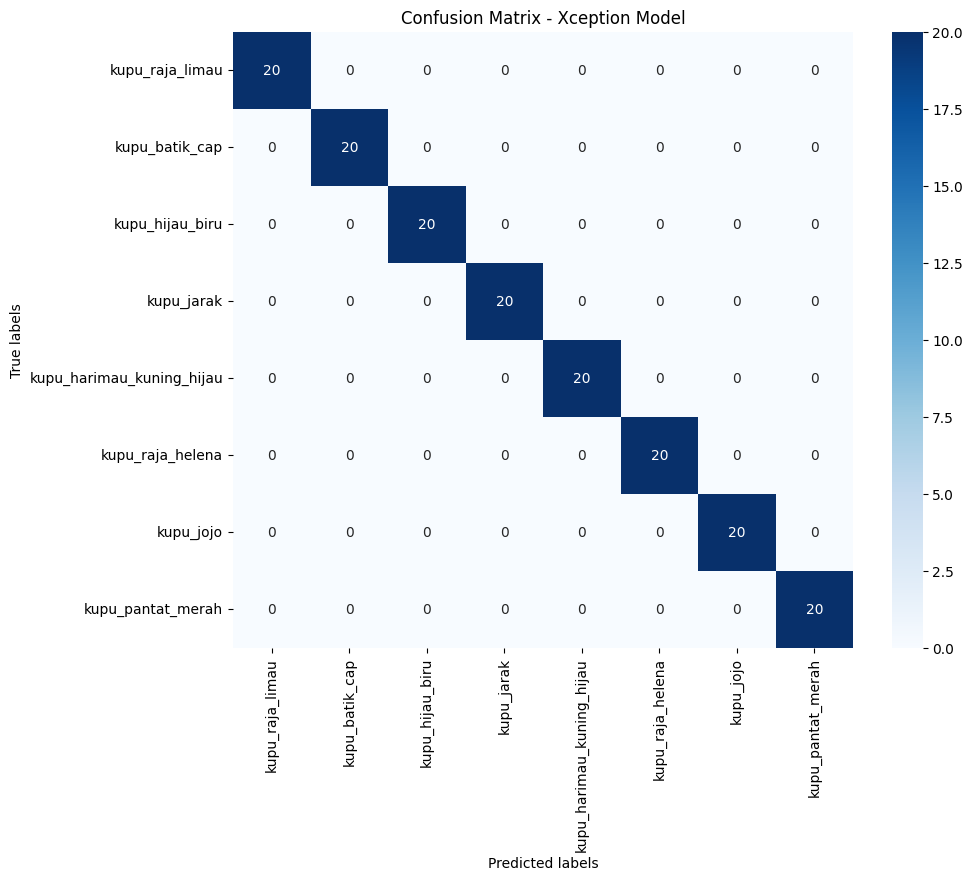

In [80]:
# Plot confusion matrix for Xception model
xception_predictions = xception_custom_model.predict(test_images)
xception_predictions_labels = np.argmax(xception_predictions, axis=1)
xception_conf_matrix = confusion_matrix(test_labels, xception_predictions_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(xception_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix - Xception Model')
plt.show()

In [81]:
def calculate_metrics(conf_matrix):
    precision = np.diag(conf_matrix) / np.sum(conf_matrix, axis=0)
    recall = np.diag(conf_matrix) / np.sum(conf_matrix, axis=1)
    f1_score = 2 * (precision * recall) / (precision + recall)
    return precision, recall, f1_score

In [82]:
inception_precision, inception_recall, inception_f1_score = calculate_metrics(inception_conf_matrix)

In [83]:
googlenet_precision, googlenet_recall, googlenet_f1_score = calculate_metrics(googlenet_conf_matrix)

<ipython-input-81-91ee1d18ddde>:2: RuntimeWarning: invalid value encountered in divide
  precision = np.diag(conf_matrix) / np.sum(conf_matrix, axis=0)
<ipython-input-81-91ee1d18ddde>:4: RuntimeWarning: invalid value encountered in divide
  f1_score = 2 * (precision * recall) / (precision + recall)


In [84]:
xception_precision, xception_recall, xception_f1_score = calculate_metrics(xception_conf_matrix)

In [85]:
metrics_df = pd.DataFrame({
    'class_name': class_names,
    'InceptionV3_precision': inception_precision,
    'InceptionV3_recall': inception_recall,
    'InceptionV3_F1_score': inception_f1_score,
    'GoogLeNet_precision': googlenet_precision,
    'GoogLeNet_recall': googlenet_recall,
    'GoogLeNet_F1_score': googlenet_f1_score,
    'Xception_precision': xception_precision,
    'Xception_recall': xception_recall,
    'Xception_F1_score': xception_f1_score
})

In [86]:
metrics_df

,class_name,InceptionV3_precision,InceptionV3_recall,InceptionV3_F1_score,GoogLeNet_precision,GoogLeNet_recall,GoogLeNet_F1_score,Xception_precision,Xception_recall,Xception_F1_score
0,kupu_raja_limau,1.0,1.0,1.0,NaN,0.00,NaN,1.0,1.0,1.0
1,kupu_batik_cap,1.0,1.0,1.0,0.000000,0.00,NaN,1.0,1.0,1.0
2,kupu_hijau_biru,1.0,1.0,1.0,NaN,0.00,NaN,1.0,1.0,1.0
3,kupu_jarak,1.0,1.0,1.0,0.073171,0.15,0.098361,1.0,1.0,1.0
4,kupu_harimau_kuning_hijau,1.0,1.0,1.0,NaN,0.00,NaN,1.0,1.0,1.0
5,kupu_raja_helena,1.0,1.0,1.0,0.071429,0.20,0.105263,1.0,1.0,1.0
6,kupu_jojo,1.0,1.0,1.0,0.183333,0.55,0.275000,1.0,1.0,1.0
7,kupu_pantat_merah,1.0,1.0,1.0,NaN,0.00,NaN,1.0,1.0,1.0


In [87]:
# Visualize models
visualkeras.layered_view(inception_custom_model, to_file='/content/PKCV/MyDrive/PROSUSCV/inception_custom_model_layers.png').show()
visualkeras.layered_view(googlenet_custom_model, to_file='/content/PKCV/MyDrive/PROSUSCV/googlenet_custom_model_layers.png').show()
visualkeras.layered_view(xception_custom_model, to_file='/content/PKCV/MyDrive/PROSUSCV/xception_custom_model_layers.png').show()

In [88]:
def predict_uploaded_images(image_paths, model):
    predictions_list = []
    for image_path in image_paths:
        # Load and preprocess the image
        img = Image.open(image_path)
        img = img.resize(IMG_SIZE)
        img_array = np.array(img) / 255.0
        img_array = np.expand_dims(img_array, axis=0)

        # Perform prediction
        predictions = model.predict(img_array)
        predicted_class_idx = np.argmax(predictions[0])
        predicted_class = class_names[predicted_class_idx]
        confidence = np.max(predictions[0]) * 100

        predictions_list.append((predicted_class, confidence))

    return predictions_list

In [89]:
def display_uploaded_images(image_paths):
    fig = plt.figure(figsize=(15, 5))
    for i, image_path in enumerate(image_paths, start=1):
        img = Image.open(image_path)
        plt.subplot(1, len(image_paths), i)
        plt.imshow(img)
        plt.axis('off')

        # Extract class name from image file name
        class_name = os.path.splitext(os.path.basename(image_path))[0]
        plt.title(class_name)
    plt.show()

In [90]:
BASE_DIR = '/content/PKCV/MyDrive/PROSUSCV/data_testing'
uploaded_image_filenames = os.listdir(BASE_DIR)
uploaded_image_paths = [os.path.join(BASE_DIR, filename) for filename in uploaded_image_filenames]

In [91]:
inception_predictions = predict_uploaded_images(uploaded_image_paths, inception_custom_model)
googlenet_predictions = predict_uploaded_images(uploaded_image_paths, googlenet_custom_model)
xception_predictions = predict_uploaded_images(uploaded_image_paths, xception_custom_model)

1/1 [==============================] - 0s 22ms/step


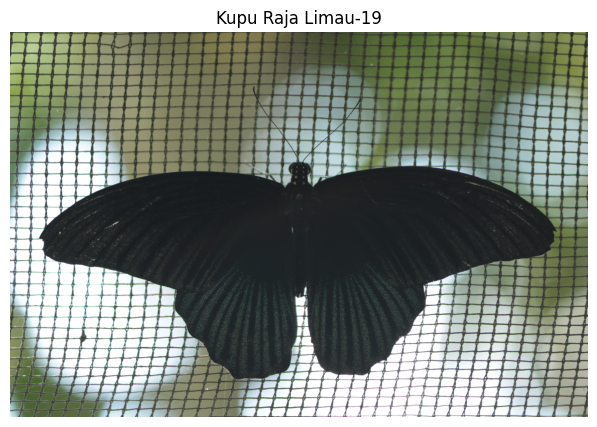

Image: Kupu Raja Limau-19
InceptionV3 Prediction: kupu_raja_limau
InceptionV3 Confidence: 100.00%
GoogLeNet Prediction: kupu_jarak
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_raja_limau
Xception Confidence: 100.00%



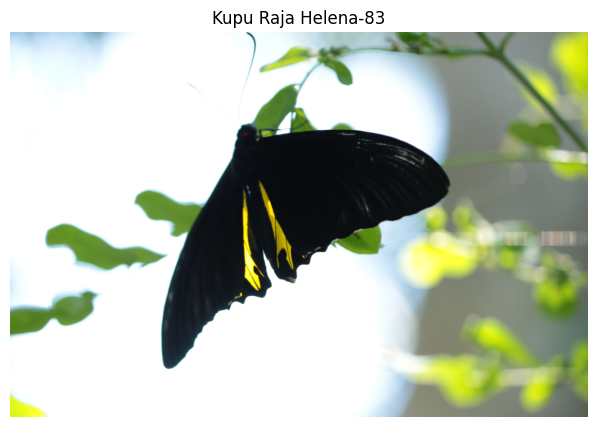

Image: Kupu Raja Helena-83
InceptionV3 Prediction: kupu_raja_helena
InceptionV3 Confidence: 93.50%
GoogLeNet Prediction: kupu_jarak
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_raja_helena
Xception Confidence: 95.67%



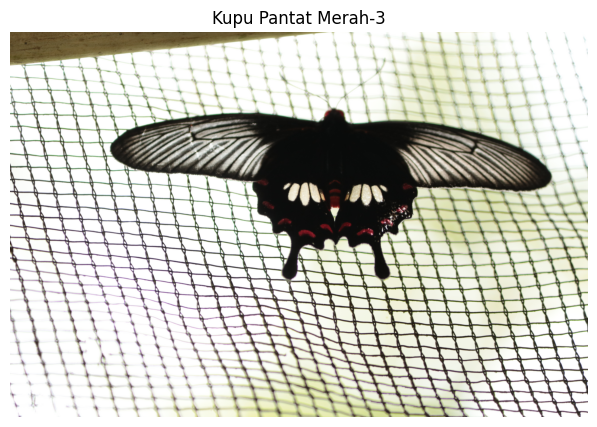

Image: Kupu Pantat Merah-3
InceptionV3 Prediction: kupu_pantat_merah
InceptionV3 Confidence: 100.00%
GoogLeNet Prediction: kupu_jojo
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_pantat_merah
Xception Confidence: 100.00%



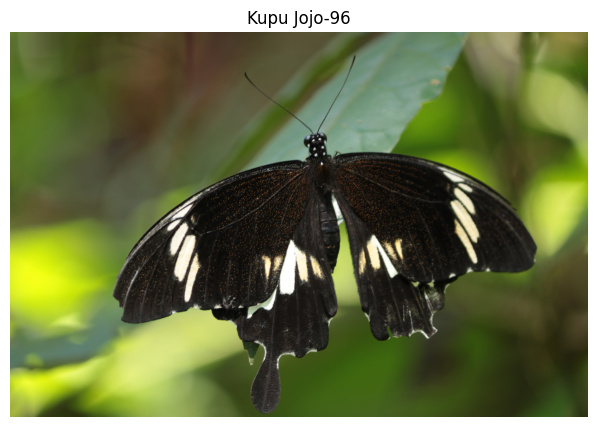

Image: Kupu Jojo-96
InceptionV3 Prediction: kupu_raja_limau
InceptionV3 Confidence: 77.53%
GoogLeNet Prediction: kupu_raja_helena
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_jojo
Xception Confidence: 100.00%



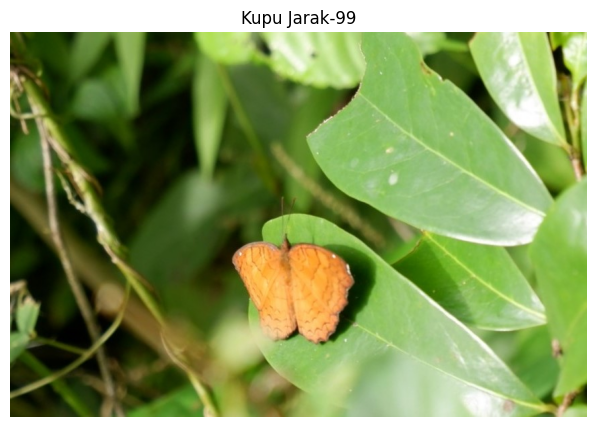

Image: Kupu Jarak-99
InceptionV3 Prediction: kupu_raja_helena
InceptionV3 Confidence: 34.92%
GoogLeNet Prediction: kupu_raja_helena
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_jarak
Xception Confidence: 100.00%



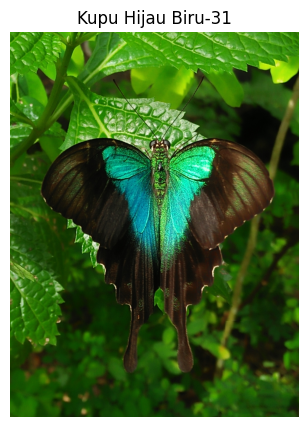

Image: Kupu Hijau Biru-31
InceptionV3 Prediction: kupu_raja_limau
InceptionV3 Confidence: 46.42%
GoogLeNet Prediction: kupu_jarak
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_raja_limau
Xception Confidence: 48.56%



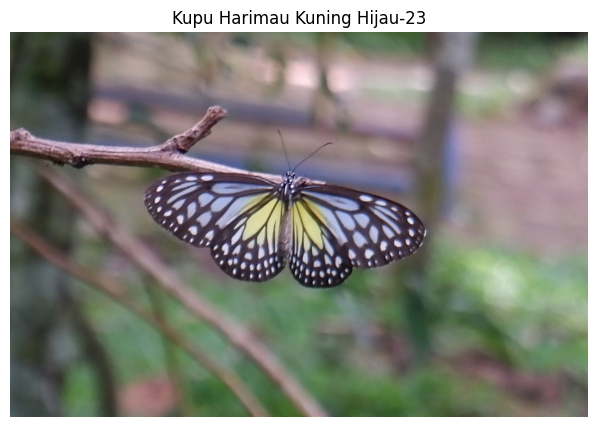

Image: Kupu Harimau Kuning Hijau-23
InceptionV3 Prediction: kupu_harimau_kuning_hijau
InceptionV3 Confidence: 95.43%
GoogLeNet Prediction: kupu_jarak
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_harimau_kuning_hijau
Xception Confidence: 100.00%



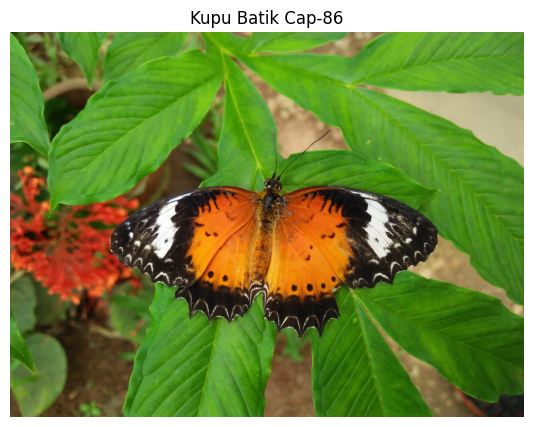

Image: Kupu Batik Cap-86
InceptionV3 Prediction: kupu_batik_cap
InceptionV3 Confidence: 95.13%
GoogLeNet Prediction: kupu_raja_helena
GoogLeNet Confidence: 100.00%
Xception Prediction: kupu_batik_cap
Xception Confidence: 99.59%



In [92]:
for i, image_path in enumerate(uploaded_image_paths, start=1):
    display_uploaded_images([image_path])
    print("Image:", os.path.splitext(os.path.basename(image_path))[0])
    print("InceptionV3 Prediction:", inception_predictions[i-1][0])
    print("InceptionV3 Confidence: {:.2f}%".format(inception_predictions[i-1][1]))
    print("GoogLeNet Prediction:", googlenet_predictions[i-1][0])
    print("GoogLeNet Confidence: {:.2f}%".format(googlenet_predictions[i-1][1]))
    print("Xception Prediction:", xception_predictions[i-1][0])
    print("Xception Confidence: {:.2f}%".format(xception_predictions[i-1][1]))
    print()